# xyzrender examples

This notebook demonstrates the use of `xyzrender` in python.
Results display inline automatically.

Install: `pip install xyzrender`

In [1]:
from xyzrender import build_config, load, measure, render, render_gif

## load() — parse once, render many times

`load()` parses the file and returns a `Molecule` object.
Pass it to `render()` to avoid re-reading the file on every call.
You can also pass a path string directly to `render()` as a shorthand.

In [2]:
mol = load("structures/caffeine.xyz")
print(mol)  # Molecule(graph=<27 nodes>, cube_data=None, cell_data=None, oriented=False)
print(f"Atoms: {mol.graph.number_of_nodes()}, Bonds: {mol.graph.number_of_edges()}")

Molecule(graph=<networkx.classes.graph.Graph object at 0x7fa9167617f0>, cube_data=None, cell_data=None, oriented=False, ensemble=None)
Atoms: 24, Bonds: 25


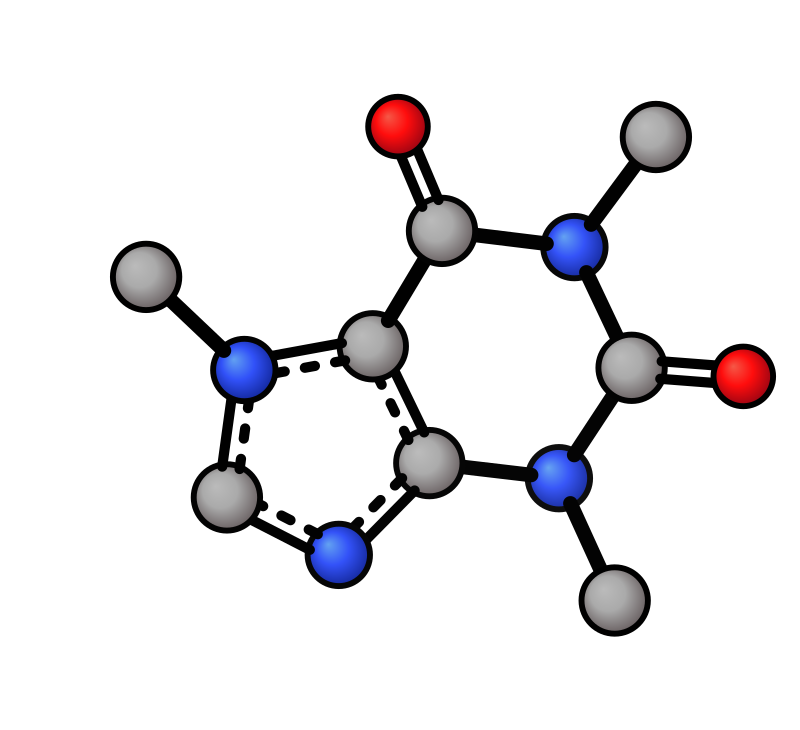

In [3]:
# Render — displays inline in Jupyter
# Save SVG (or PNG/PDF) at the same time with `output`
# render(mol, output="images/caffeine_default.svg")
mol = load("structures/caffeine.xyz")

render(mol, hue_shift_factor=0.1, light_shift_factor=0.2, saturation_shift_factor=0.1)

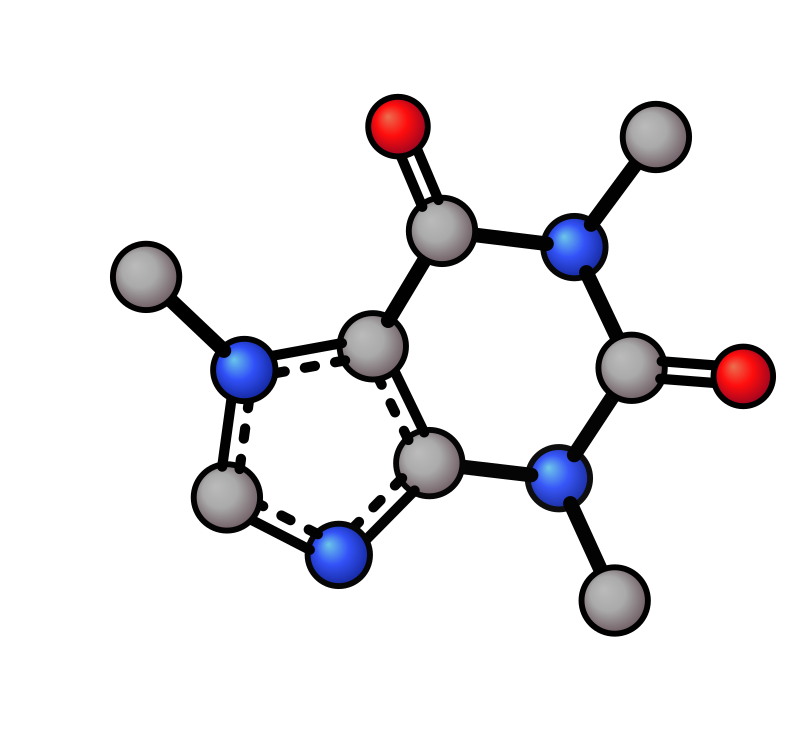

In [4]:
mol = load("structures/caffeine.xyz")
render(mol, hue_shift_factor=0.2, light_shift_factor=0.2, saturation_shift_factor=0.2)

## Styling

All CLI flag names are accepted as keyword arguments.
Pass a preset name (`"flat"`, `"paton"`, `"default"`) or a path to a custom JSON config.

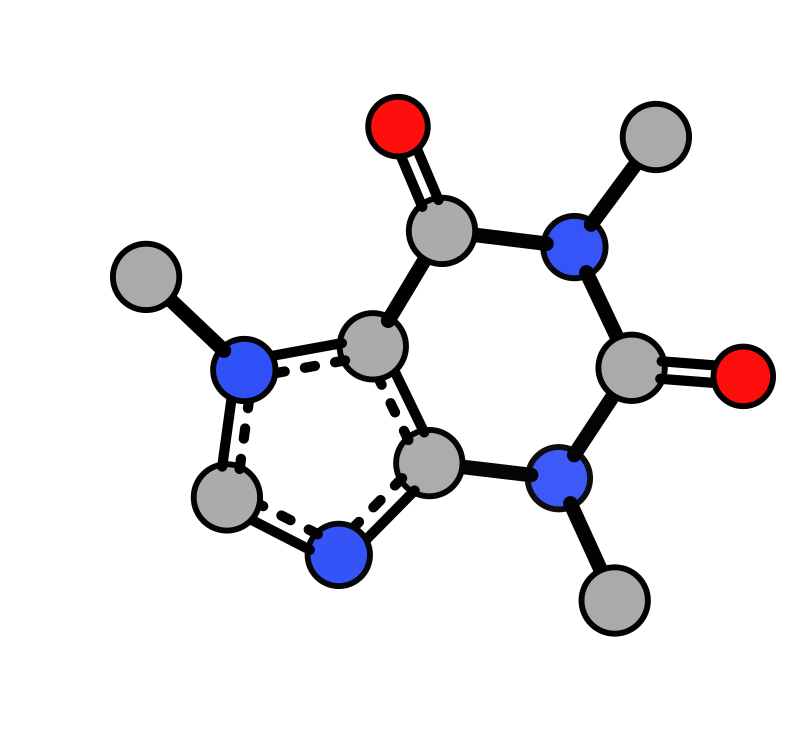

In [5]:
render(mol, config="flat")

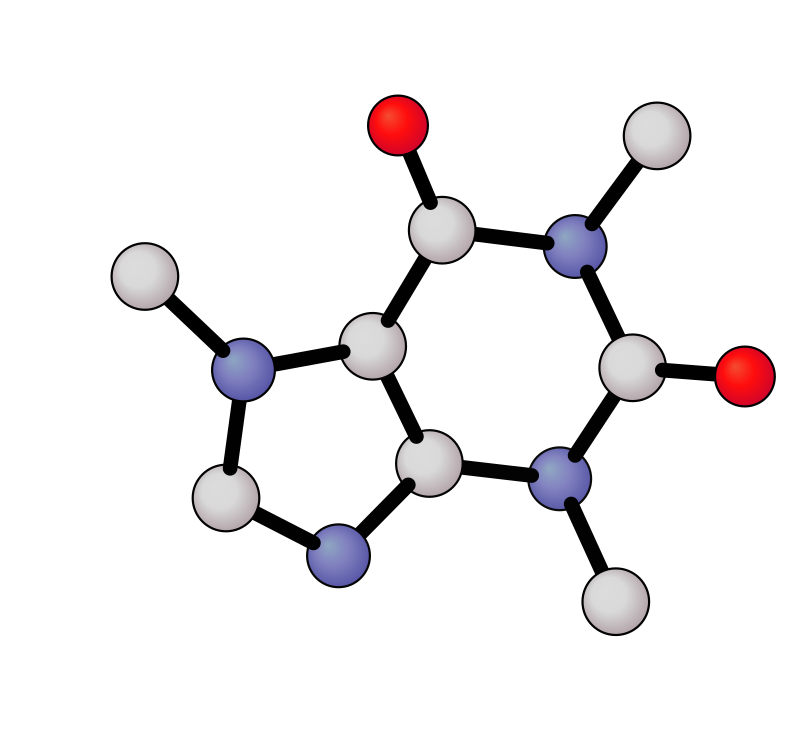

In [6]:
render(mol, config="paton", transparent=True)

### Tube and wire presets

`tube` and `wire` hide atom circles and colour each bond by its endpoint atoms.
`tube` uses thick bonds with cylinder shading; `wire` is thinner.

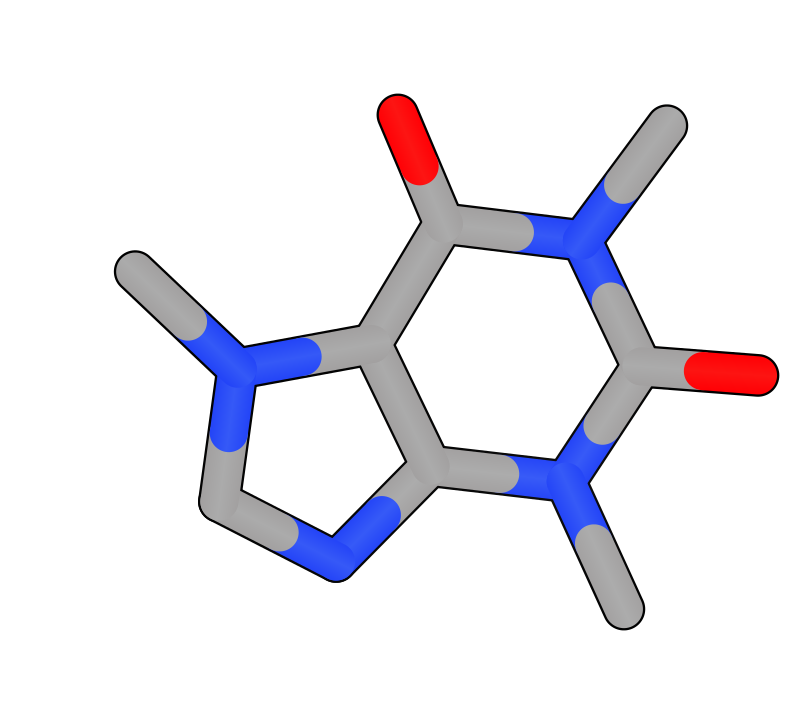

In [7]:
mol = load("structures/caffeine.xyz")
render(mol, config="tube")

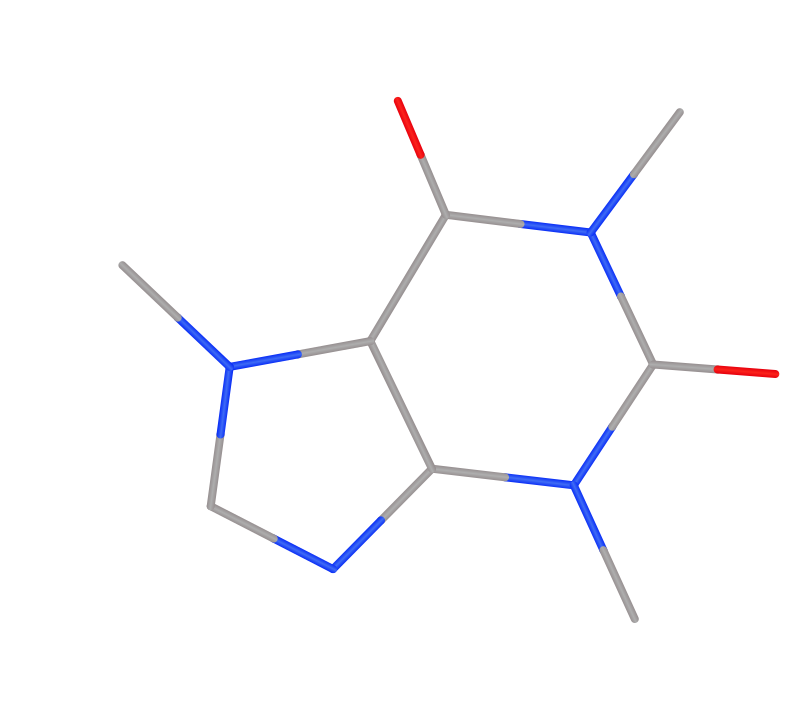

In [8]:
render(mol, config="wire")

### Style regions

Render subsets of atoms with a different preset. Useful for QM/MM regions, active sites, or highlighting a fragment in a different style. Each region is a `(atom_indices, preset)` tuple — indices are 1-indexed lists.

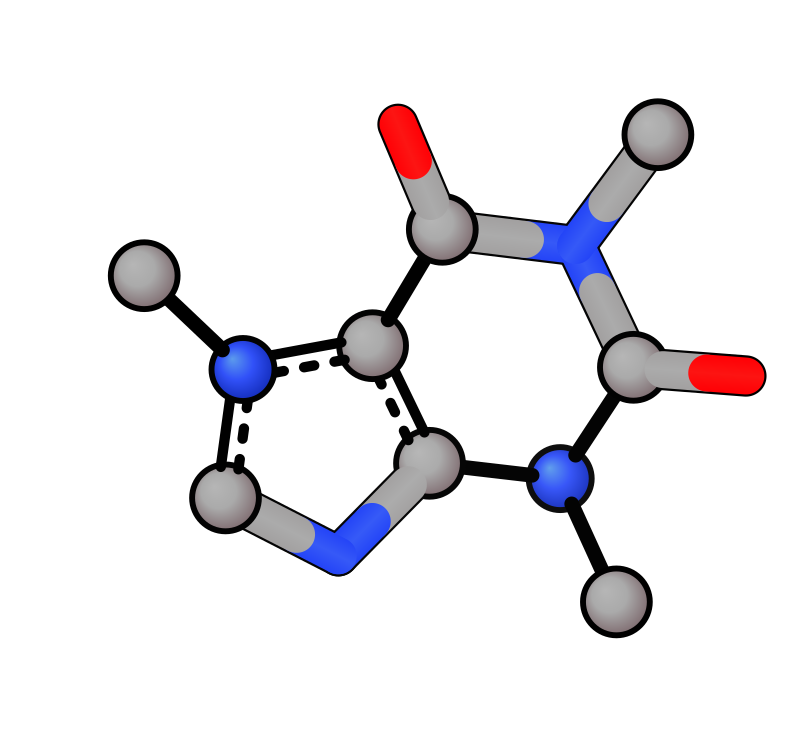

In [9]:
# Tube base with ball-stick region for atoms 1-10
render(mol, config="tube", regions=[("1-10", "default")])

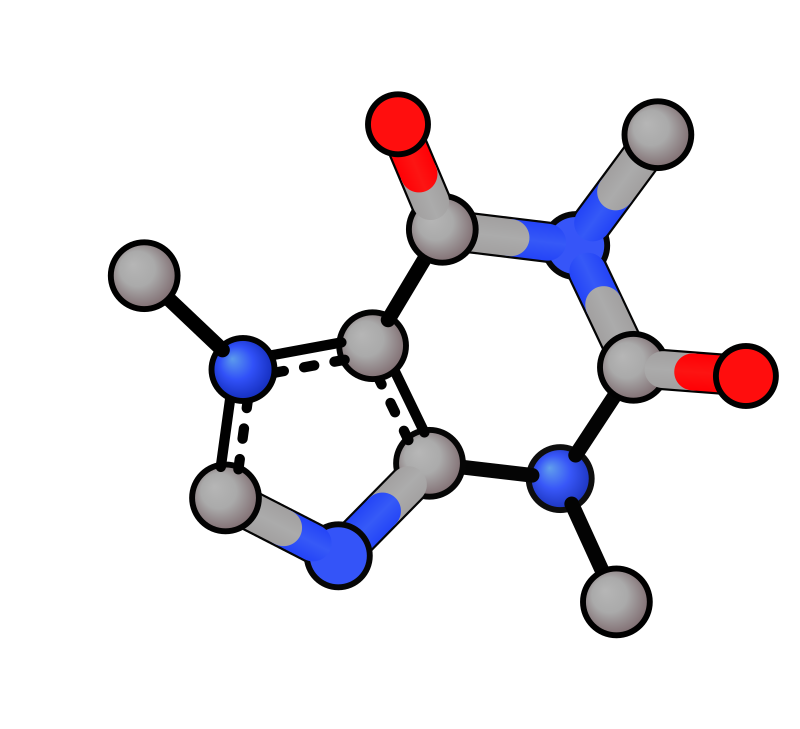

In [10]:
# Multiple regions with different presets
render(mol, config="tube", regions=[("1-10", "default"), ("11-18", "flat")])

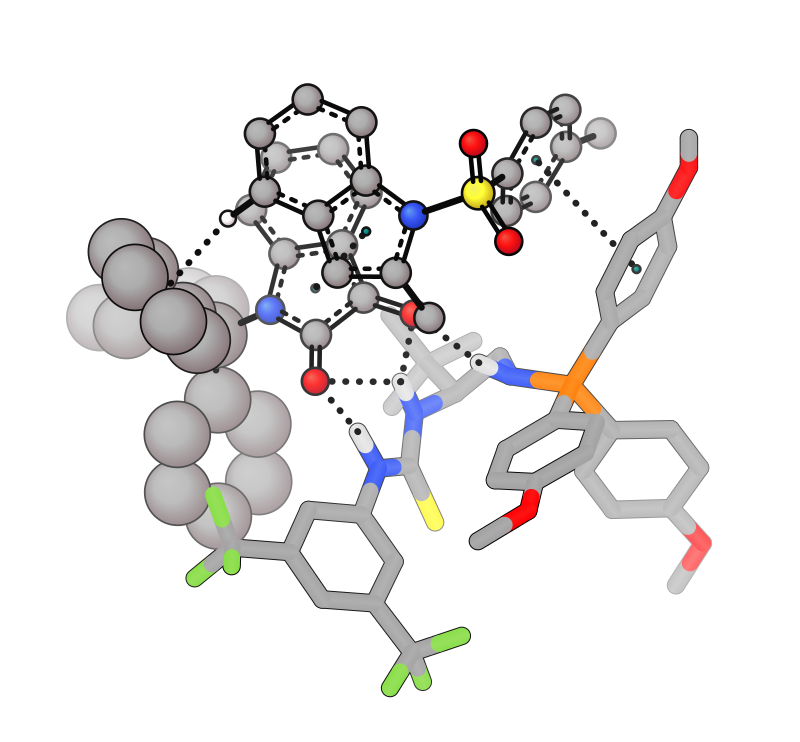

In [11]:
# Larger system: tube for one fragment, bubble for another, with NCI detection
bimp = load("structures/bimp.v000.xyz", nci_detect=True)
render(bimp, config="default", orient=False, regions=[("84-165", "tube"), ("4,37-68", "bubble")])

### Bond coloring options

Element-coloured bonds and cylinder shading can be toggled independently on any preset.

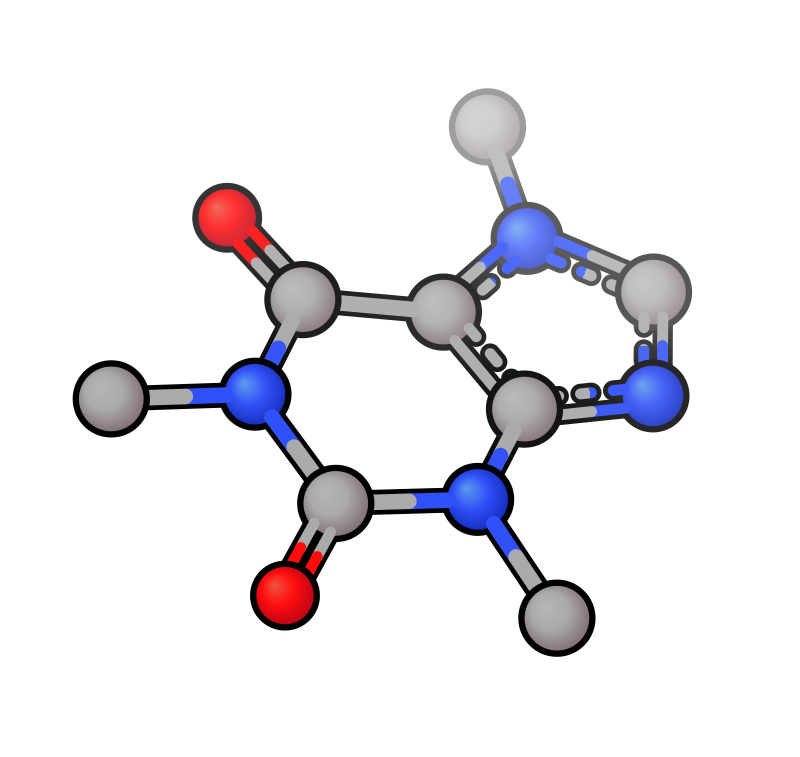

In [56]:
# Element-coloured bonds on the default preset (half-bond split at VdW-weighted midpoint)
render(mol, bond_color_by_element=True, bond_outline_width=6)

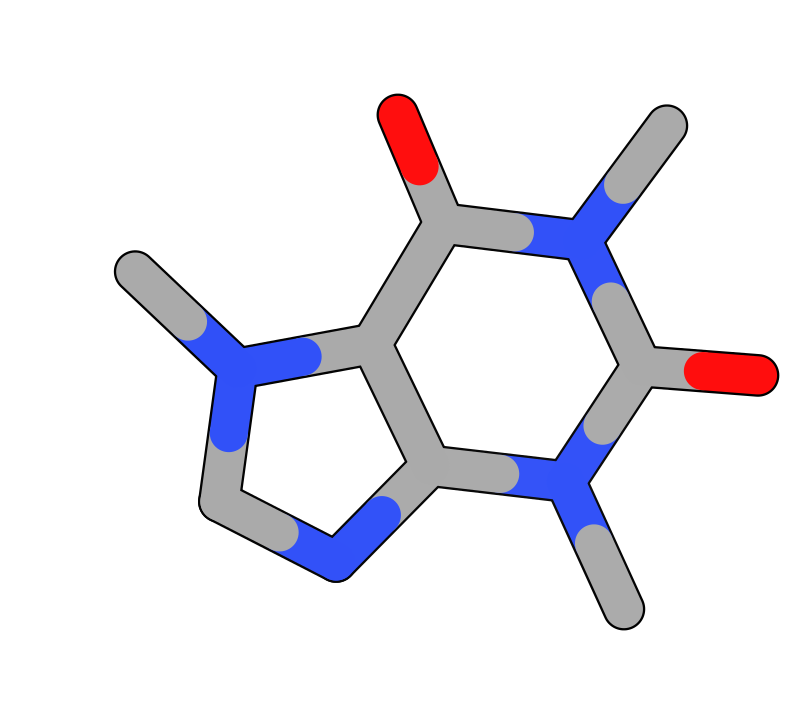

In [13]:
# Cylinder shading on default ball-stick (gradient uses same get_gradient_colors as atoms)
render(mol, config="tube", bond_gradient=False)

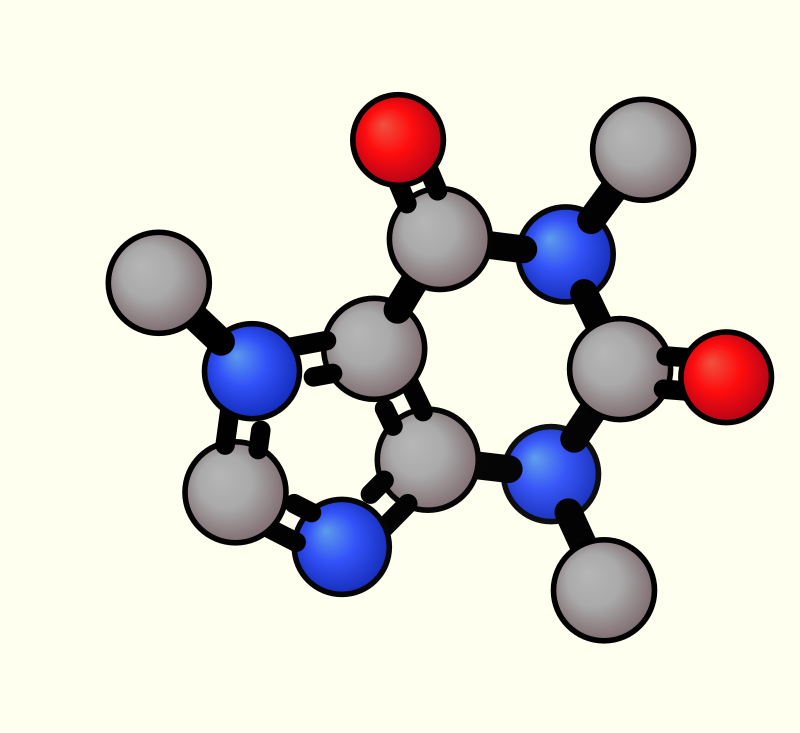

In [14]:
render(mol, bond_width=40, atom_scale=4, background="ivory")

### Hydrogen visibility

`hy=True` shows all H, `no_hy=True` hides all H, `hy=[1, 2, ...]` shows specific atoms (1-indexed).

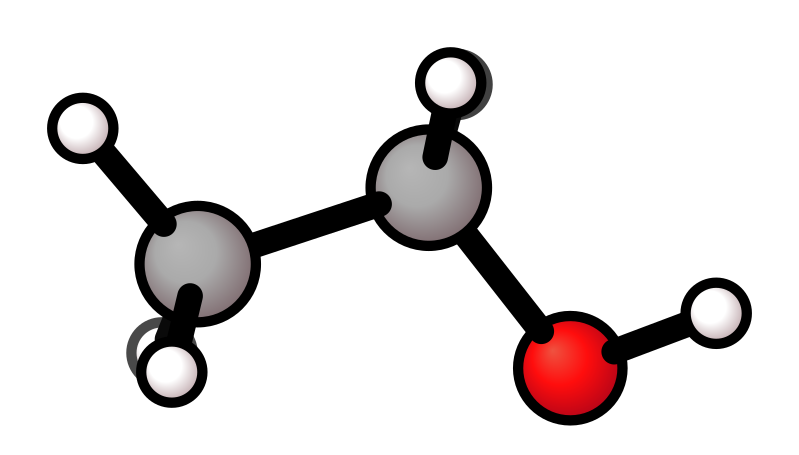

In [15]:
ethanol = load("structures/ethanol.xyz")

# Show all hydrogens
render(ethanol, hy=True)

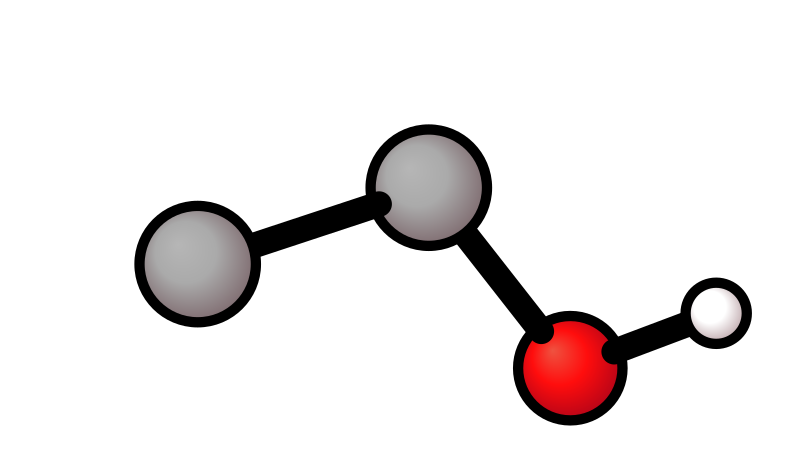

In [16]:
# Hide all hydrogens
render(ethanol, no_hy=True)

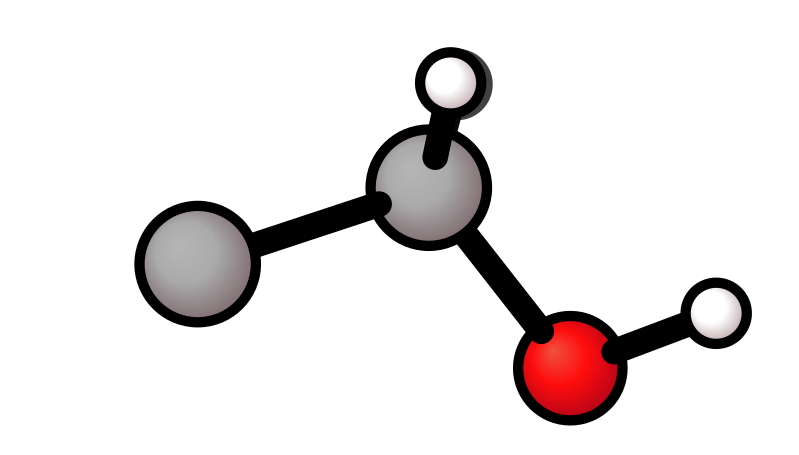

In [17]:
# Show specific H atoms (1-indexed)
render(ethanol, hy=[7, 8, 9])

## Reusing a style config

`build_config()` builds a `RenderConfig` object you can pass to `render()` and `render_gif()`.
Useful when applying the same style to multiple molecules in a loop or notebook session.

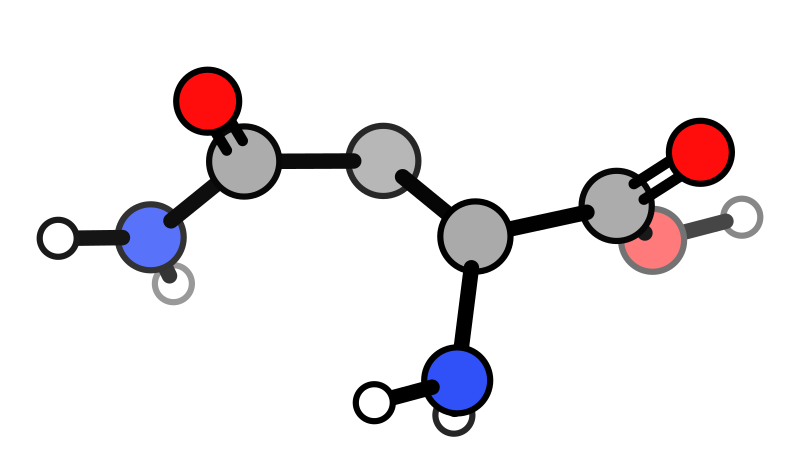

In [18]:
cfg = build_config("flat", atom_scale=2.5, gradient=False)

asparagine = load("structures/asparagine.xyz")
render(asparagine, config=cfg)

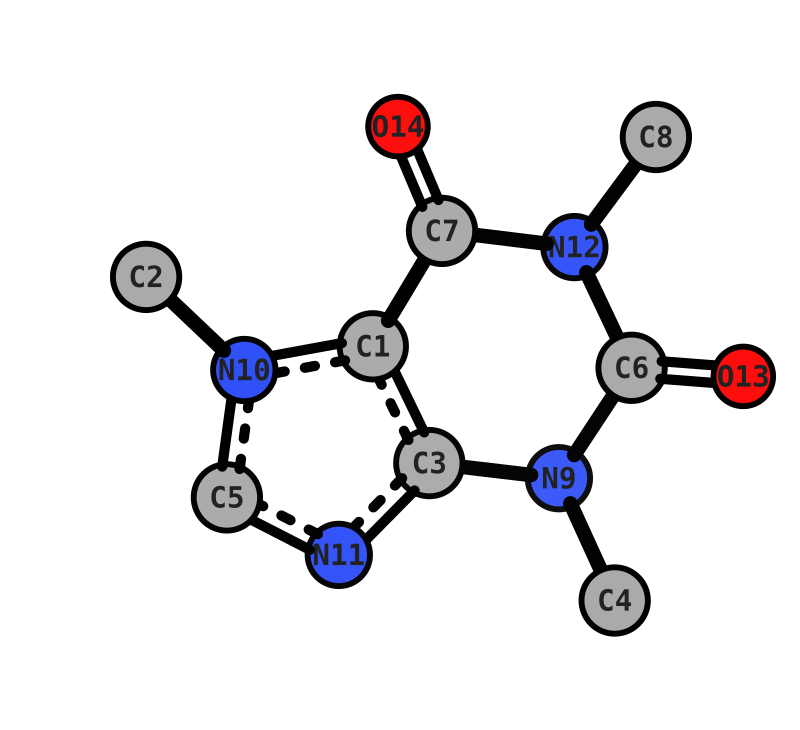

In [19]:
# Same config, different molecule — per-render overlays are fine
render(mol, config=cfg, idx=True)

## Geometry measurements

`measure()` returns bonded distances, angles, and dihedrals as a dict. It does not render anything.

In [20]:
data = measure(ethanol)
print("Bond distances:")
for i, j, d in data["distances"]:
    print(f"  {i + 1}-{j + 1}: {d:.3f} Å")

Bond distances:
  1-2: 1.498 Å
  1-4: 1.104 Å
  1-5: 1.089 Å
  1-6: 1.095 Å
  2-3: 1.412 Å
  2-7: 1.098 Å
  2-8: 1.106 Å
  3-9: 0.960 Å


In [21]:
# Subset of measurement types; also accepts a path directly
data = measure("structures/caffeine.xyz", modes=["d", "a"])
print(f"{len(data['distances'])} distances, {len(data['angles'])} angles")

25 distances, 43 angles


## Overlays

TS bonds, NCI bonds, vdW spheres, atom indices, and annotations can be added to any render.

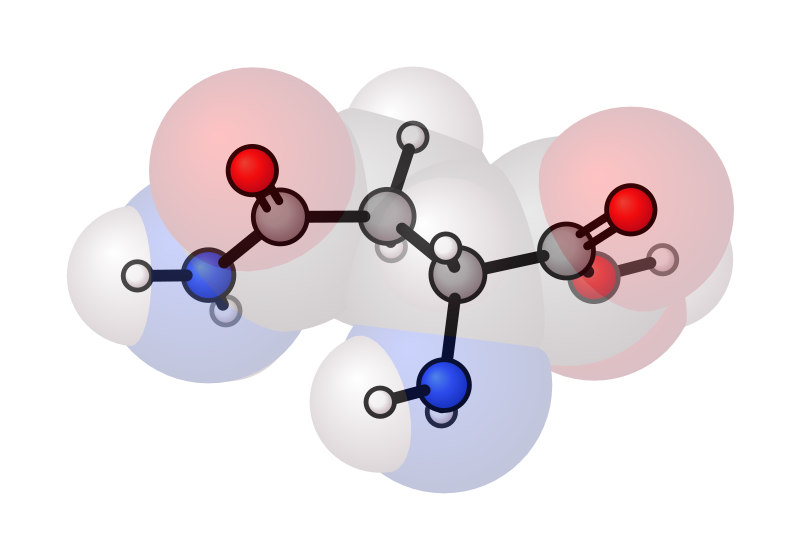

In [22]:
# vdW spheres on all atoms
render(asparagine, vdw=True, hy=True)

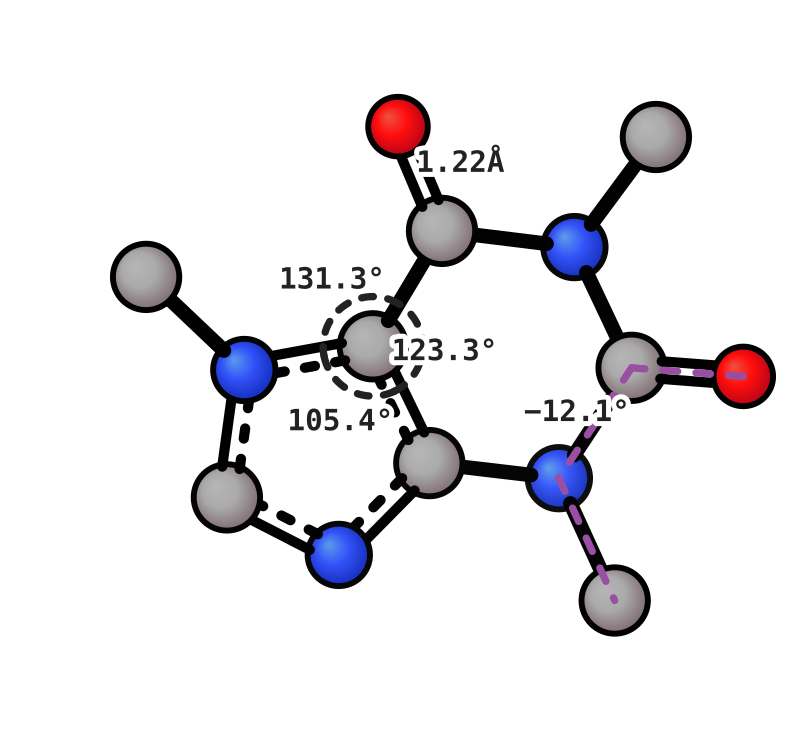

In [23]:
# SVG annotations: distance, angle, custom text
render(mol, labels=["13 6 9 4 t", "1 a", "14 d"])

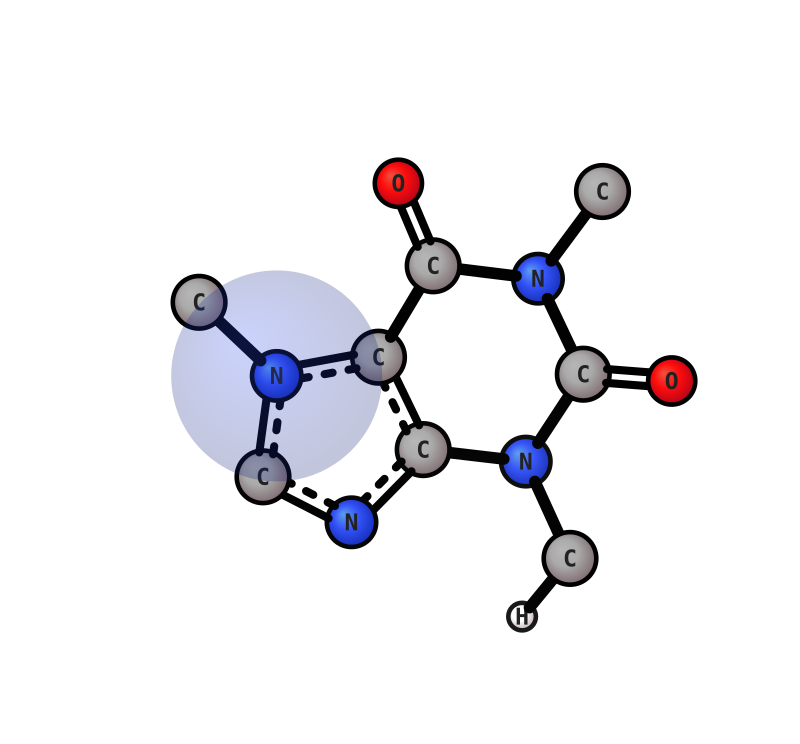

In [24]:
render(mol, vdw=[10], hy=[20], idx="s")

## Atom property colormap

Color atoms by any per-atom scalar value — partial charges, spin density, NBO charges, etc.
`cmap` accepts a `{1-indexed atom: value}` dict, so a pandas DataFrame maps naturally.
Atoms absent from the mapping are drawn white.

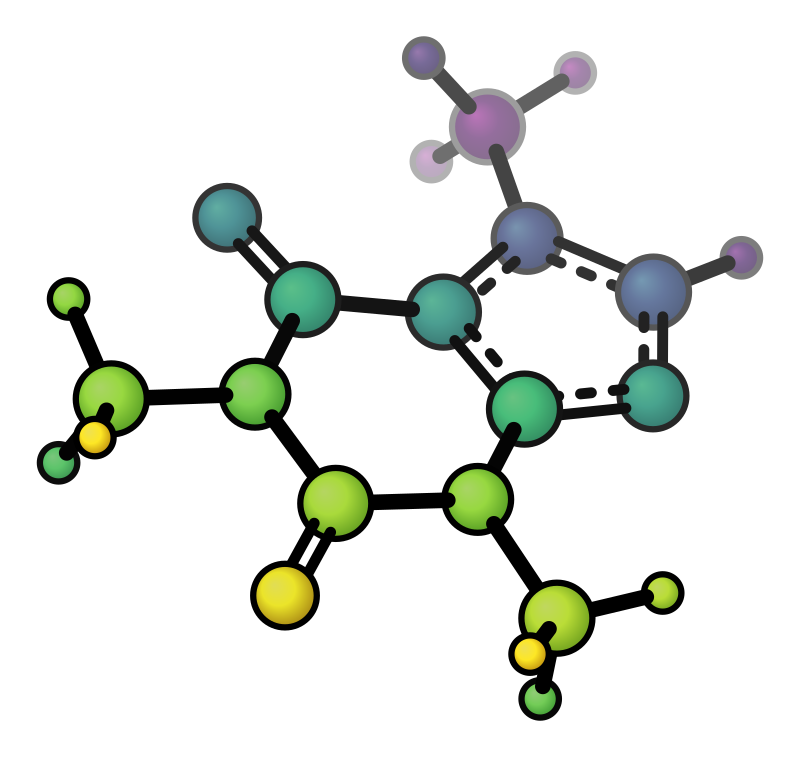

In [25]:
# Simple example: color atoms by z-coordinate (no extra dependencies)
cmap_values = {i + 1: data["position"][2] for i, data in mol.graph.nodes(data=True) if data.get("symbol", "") != "*"}

render(mol, cmap=cmap_values, cmap_range=(-2.0, 2.0), hy=True, orient=False)

# --- pandas version (comment out above and uncomment below) ---
# import pandas as pd
# df = pd.DataFrame([
#     {"atom": i + 1, "symbol": data["symbol"], "charge": ...}
#     for i, data in mol.graph.nodes(data=True)
#     if data.get("symbol", "") != "*"
# ])
# render(mol, cmap=dict(zip(df["atom"], df["charge"])), cmap_range=(-0.5, 0.5))

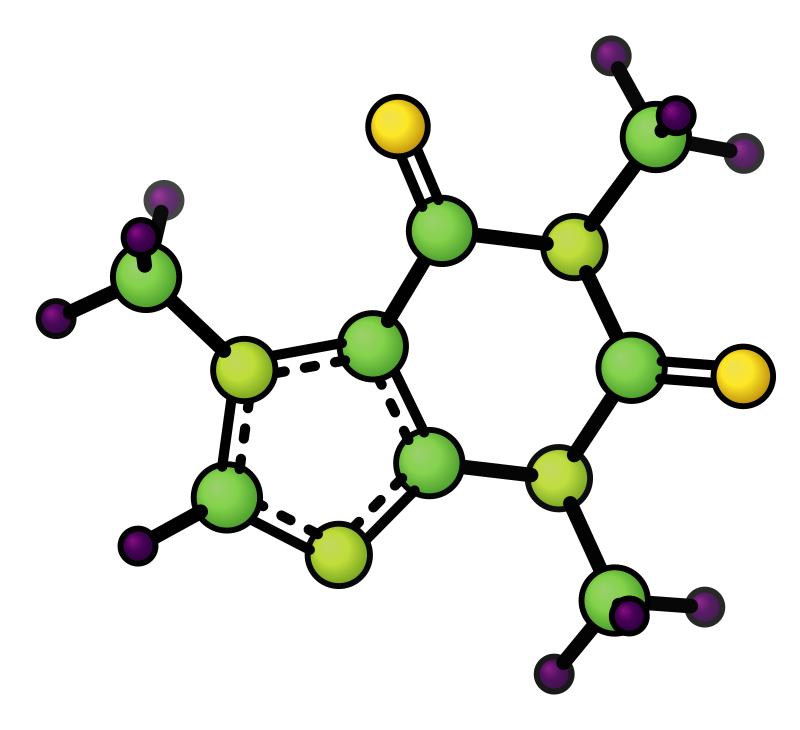

In [26]:
from xyzgraph import DATA

# use symbol-to-atomic-number mapping for properties
cmap_values = {
    i + 1: DATA.s2n.get(data["symbol"], 0)
    for i, data in mol.graph.nodes(data=True)
    if data.get("symbol", "") != "*"  # could be dummys from NCIs etc
}
render(mol, cmap=cmap_values, hy=True)

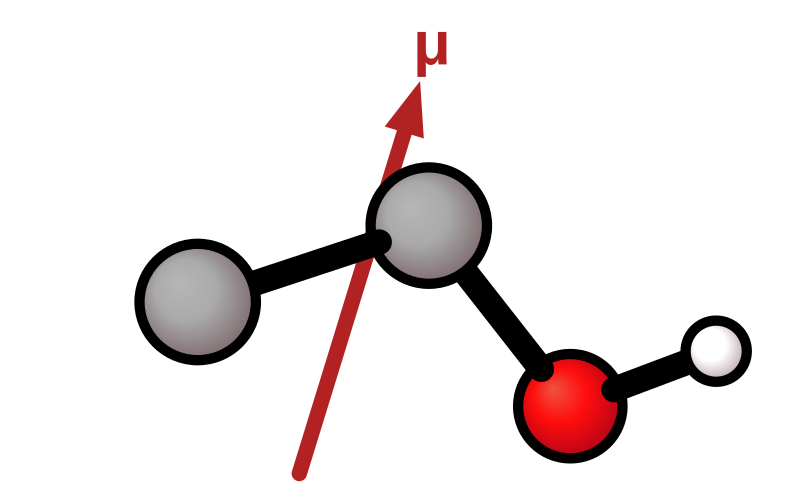

In [27]:
from xyzrender import load, render

etoh = load("structures/ethanol.xyz")
vec = {
    "anchor": "center",
    "vectors": [
        {
            "origin": "com",
            "vector": [1.0320170291976951, -0.042708195030485986, -1.332397645862797],
            "color": "firebrick",
            "label": "μ",
        }
    ],
}
render(etoh, vector=vec, vector_scale=1.5)

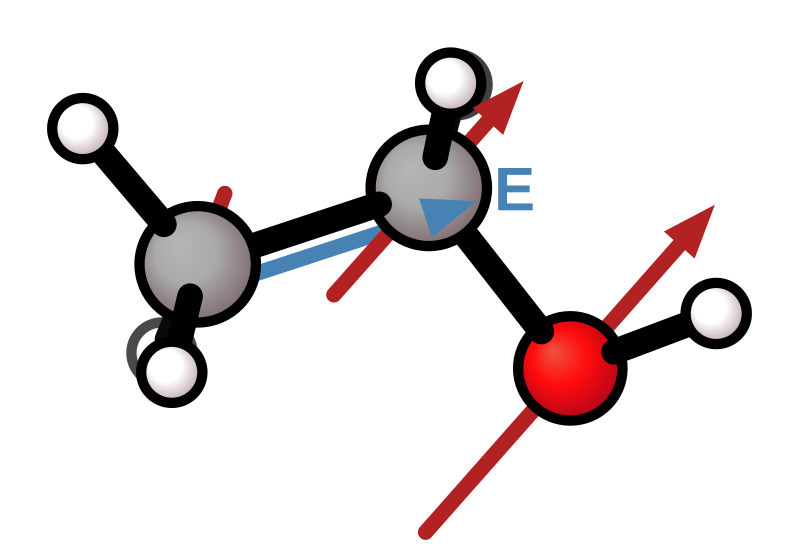

In [28]:
render(etoh, hy=True, vector="structures/ethanol_forces_efield.json", vector_scale=2)

## Interactive orientation

`orient()` opens the 3D viewer ([**v**](https://github.com/briling/v)) so you can rotate the molecule manually.
Press `z` to output the rotated coordinates, then `q` to quit.
The molecule is updated in-place and `mol.oriented` is set to `True`, so subsequent `render()` calls skip PCA auto-orientation.

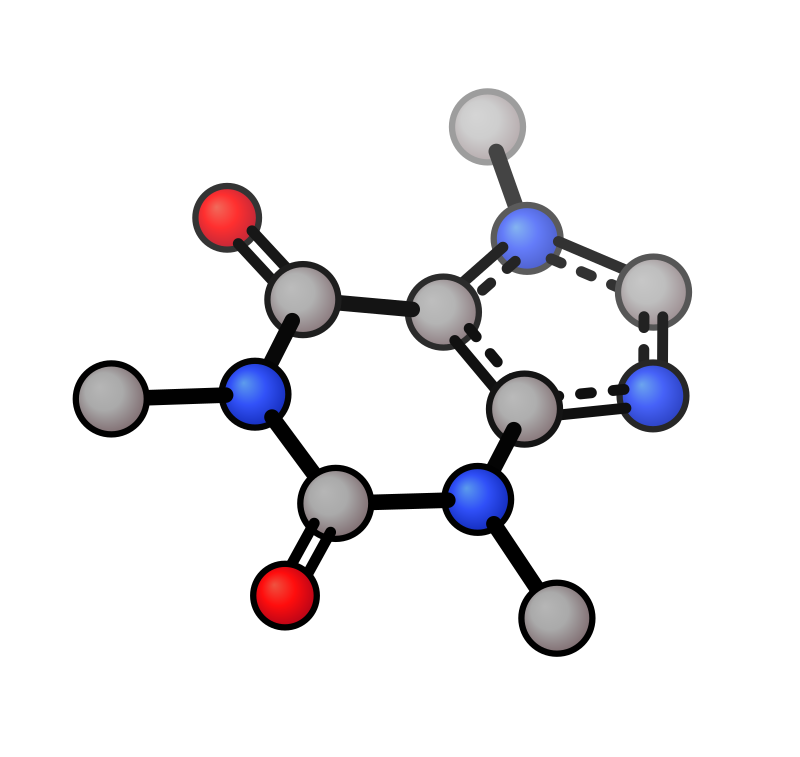

In [29]:
from xyzrender import load, orient

mol = load("structures/caffeine.xyz")

# interactive orientation of mol using `vmol`
# - orient molecule as desired, then `q` or `esc` to quit
# - mol is modified in-place, with the new coordinates
# requires `vmol` to be installed:
#       pip install vmol
#           # or
#       pip install xyzrender[v]
orient(mol)
render(mol)

**SMILES input**

`load(..., smiles=True)` embeds a SMILES string into 3D using rdkit with a quick conformational pre-screen (ETKDGv3 + MMFF94).
Requires `pip install 'xyzrender[smi]'`.

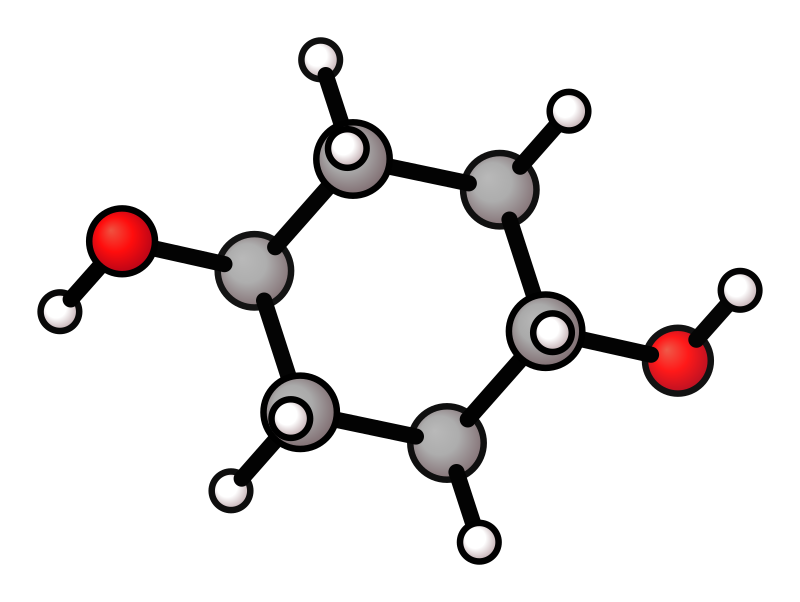

In [30]:
smi = load("C1CC(O)CCC1O", smiles=True)
render(smi, hy=True)

**RDKit Mol input**

Pass an RDKit `Mol` with embedded 3D conformers straight to `load()` — useful when you want to control embedding, protonation, or conformer generation yourself.
`load(mol)` renders one conformer; `load(mol, ensemble=True)` overlays them all.
Requires `pip install 'xyzrender[smi]'`.

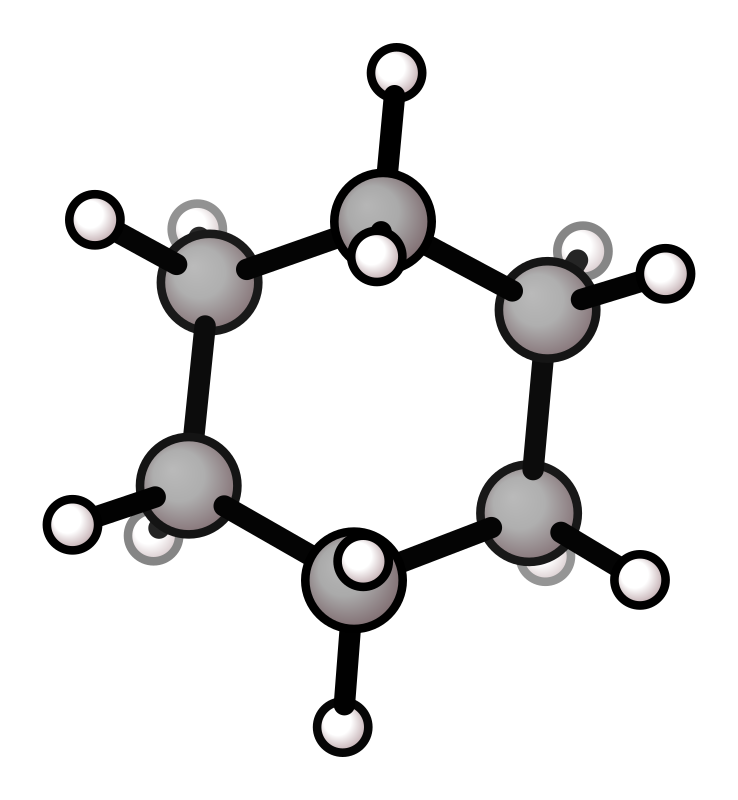

In [31]:
from rdkit import Chem
from rdkit.Chem import AllChem

# Build a Mol however you like, then hand it to load()
rdmol = Chem.AddHs(Chem.MolFromSmiles("C1CCCCC1"))
AllChem.EmbedMultipleConfs(rdmol, numConfs=8, randomSeed=42)

render(load(rdmol), hy=True)  # load(mol) renders one conformer

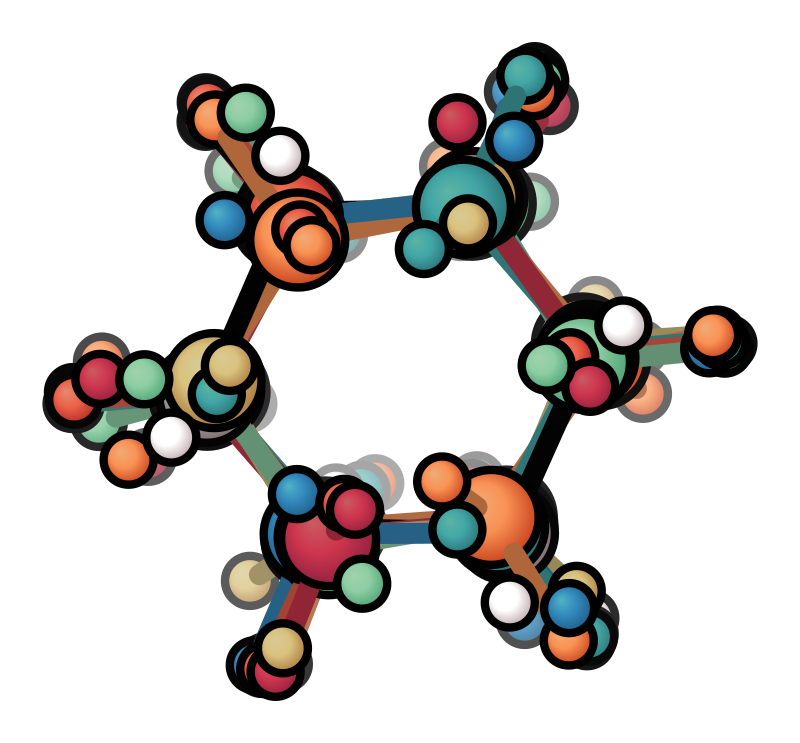

In [57]:
# ensemble=True overlays every conformer (RMSD-aligned) in one image
render(load(rdmol, ensemble=True, ensemble_color="spectral"))

**Saving geometry**

`mol.to_xyz(path)` writes the molecule to an XYZ file.
If `mol` has `cell_data`, the output is extXYZ with a `Lattice=` header (reloadable with `load(..., cell=True)`).
Ghost atoms are excluded.

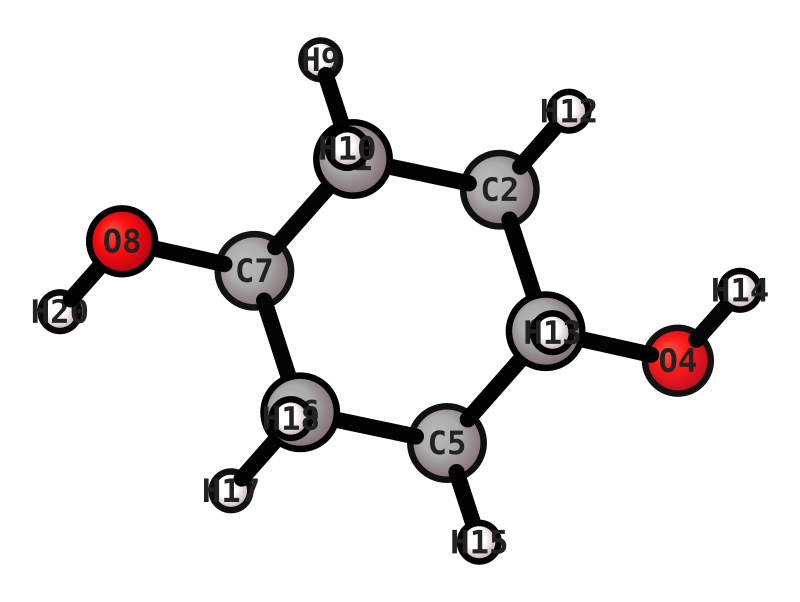

In [33]:
smi.to_xyz("smi.xyz")
render("smi.xyz", hy=True, idx=True)

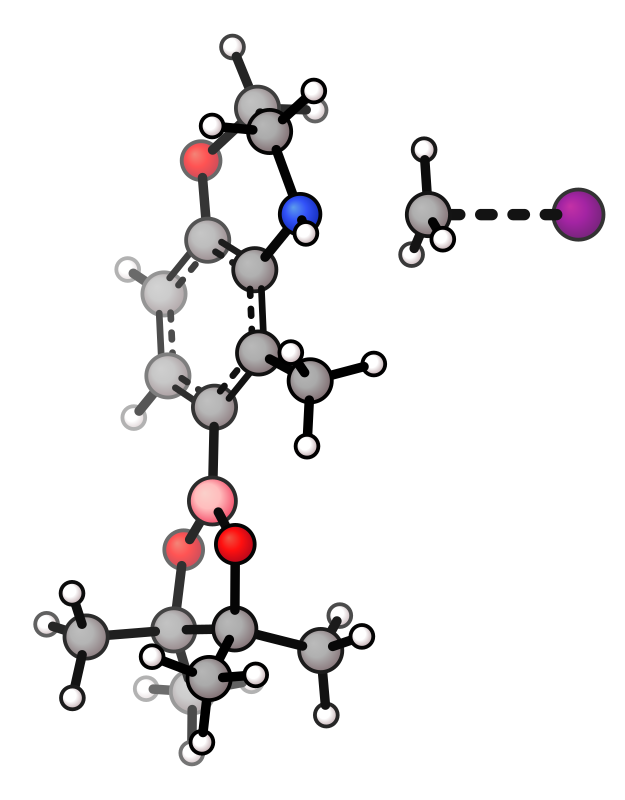

In [34]:
# Manual TS bond overlay (1-indexed atom pairs)
sn2 = load("structures/sn2.out")
render(sn2, ts_bonds=[(1, 2)], hy=True)

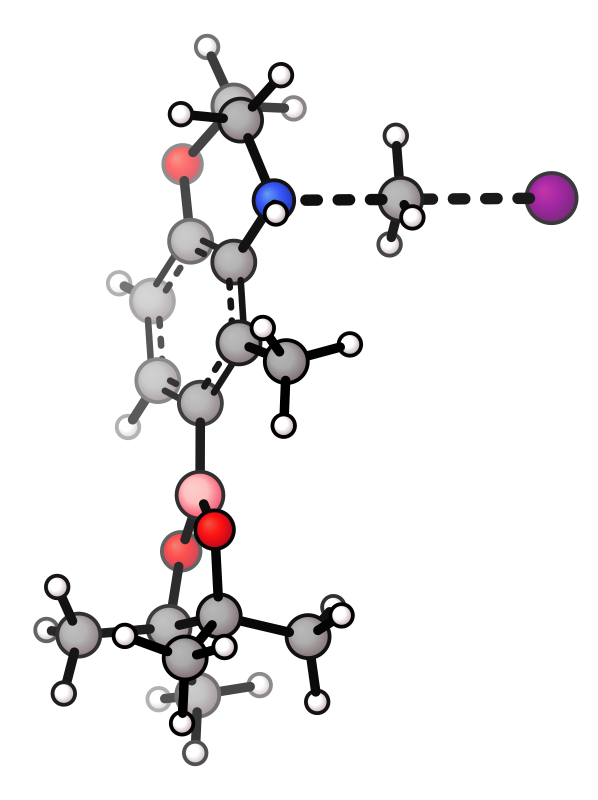

In [35]:
# Auto-detect TS bonds from imaginary frequency (requires graphRC)
sn2_ts = load("structures/sn2.out", ts_detect=True)
render(sn2_ts, hy=True)

## Overlay structures

Show two geometries of the same molecule for quick visual comparison.

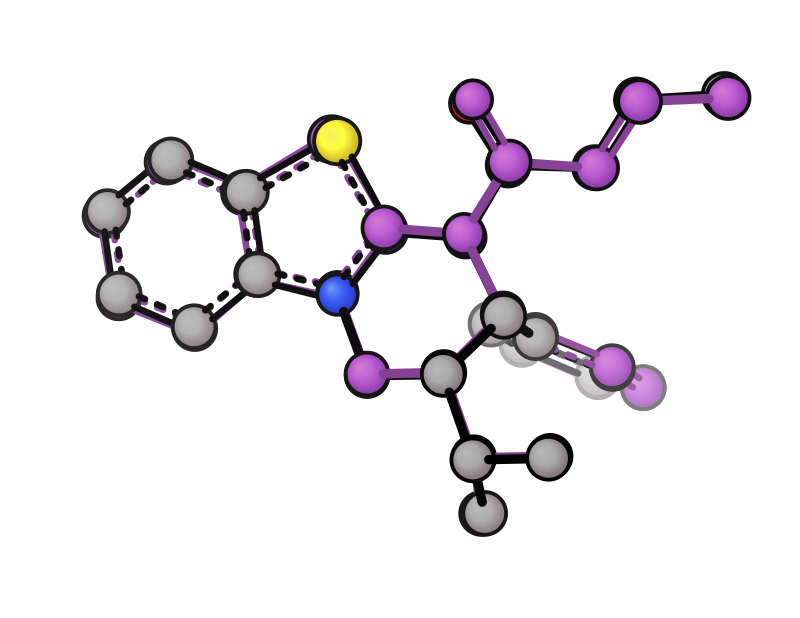

In [36]:
mol1 = load("structures/isothio_xtb.xyz", charge=1)
mol2 = load("structures/isothio_uma.xyz", charge=1)

render(mol1, overlay=mol2)

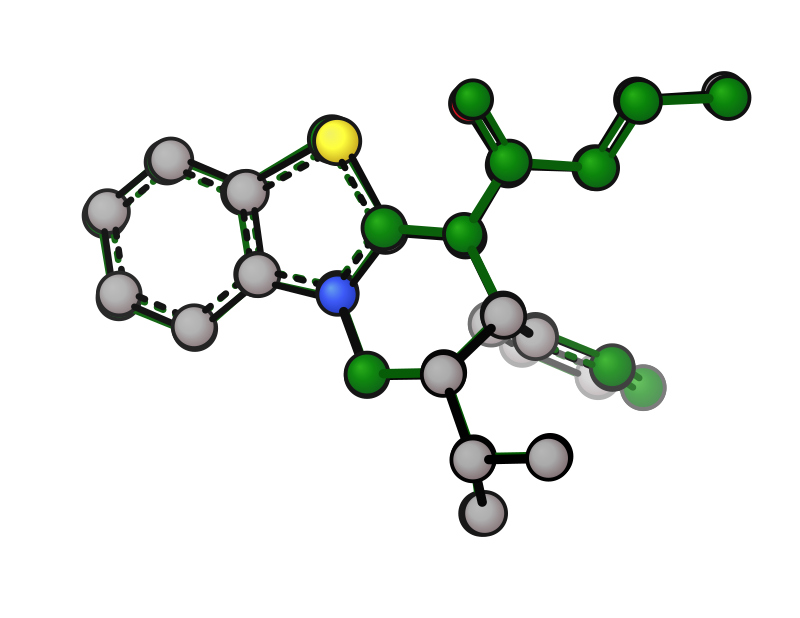

In [37]:
render(mol1, overlay=mol2, overlay_color="green")

GIFResult(path=PosixPath('/tmp/tmphy47sx5j.gif'))
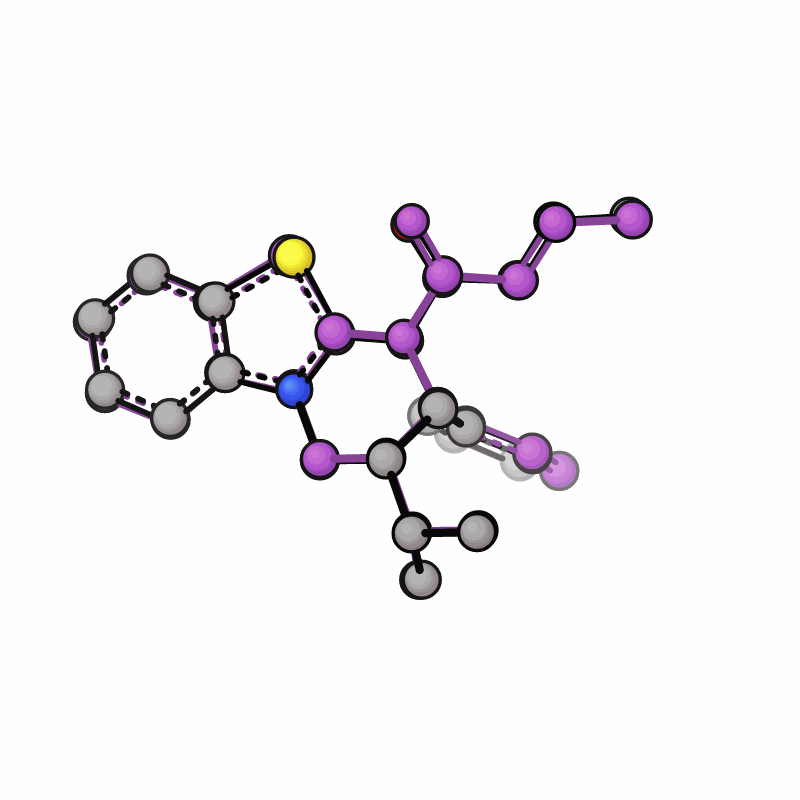

In [38]:
render_gif(mol1, overlay=mol2, gif_rot="y")

## Molecular orbital surface

Load a `.cube` file and pass `mo=True`. The cube file contains both geometry and the volumetric MO grid.

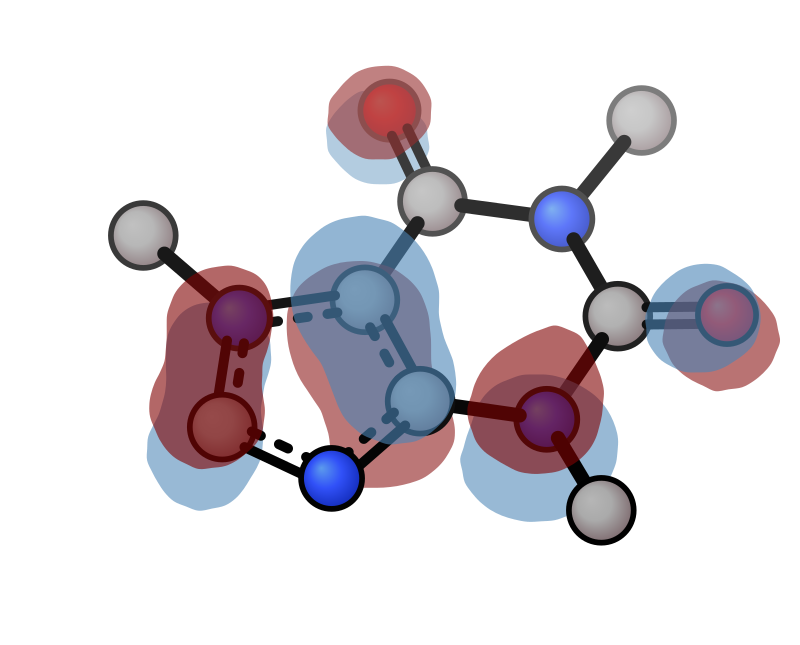

In [39]:
mol_homo = load("structures/caffeine_homo.cube")
render(mol_homo, mo=True)

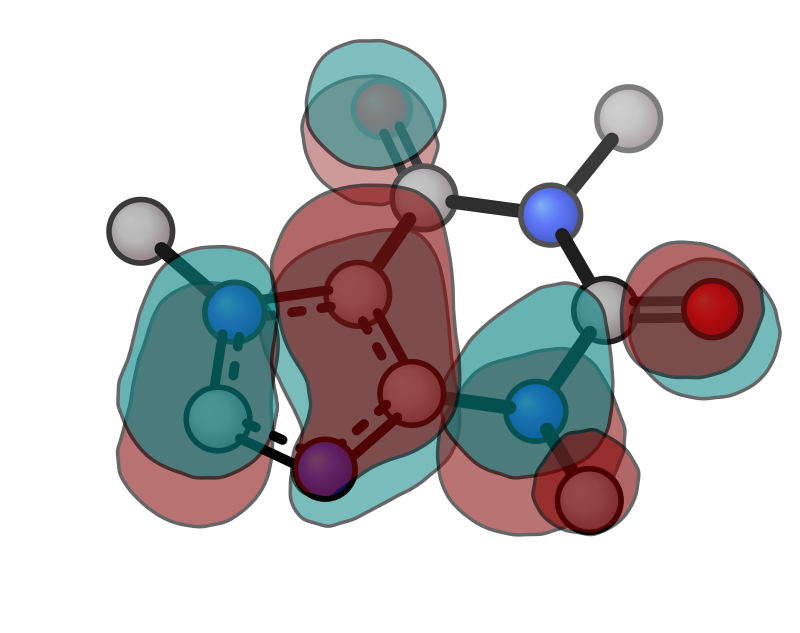

In [61]:
# Custom isovalue and lobe colours
render(mol_homo, mo=True, iso=0.03, mo_pos_color="maroon", mo_neg_color="teal", mo_outline_width=5)

## Electron density surface

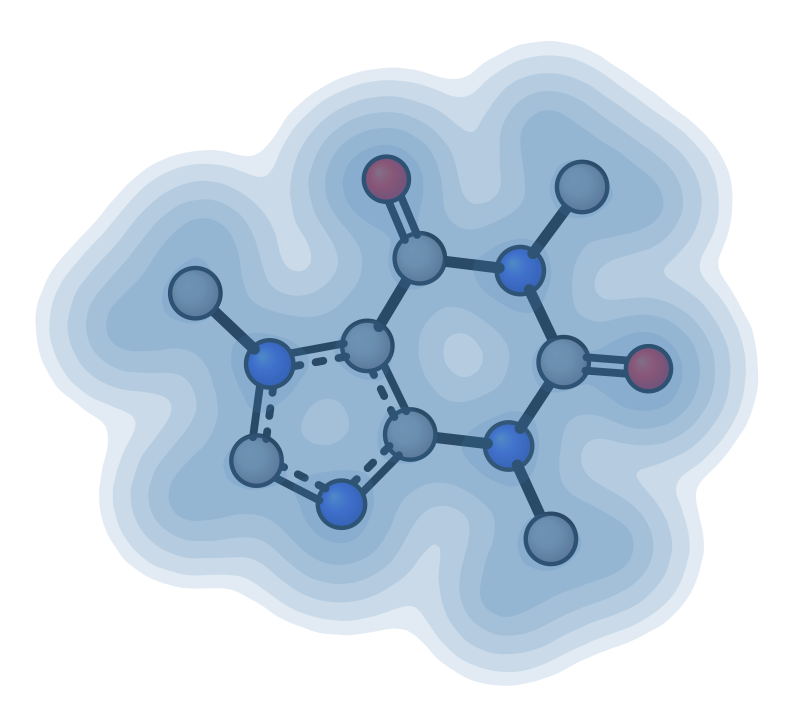

In [41]:
mol_dens = load("structures/caffeine_dens.cube")
render(mol_dens, dens=True)

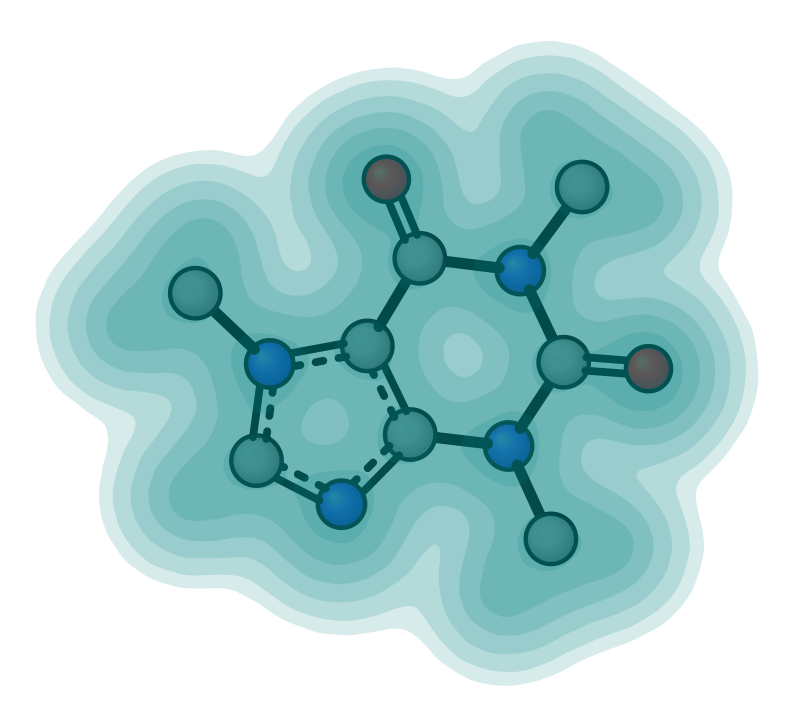

In [42]:
render(mol_dens, dens=True, dens_color="teal", iso=0.001)

## Electrostatic potential (ESP) surface

Pass a density cube as `molecule` (via `load()`) and the ESP cube as `esp=`.
Both cubes must come from the same calculation.

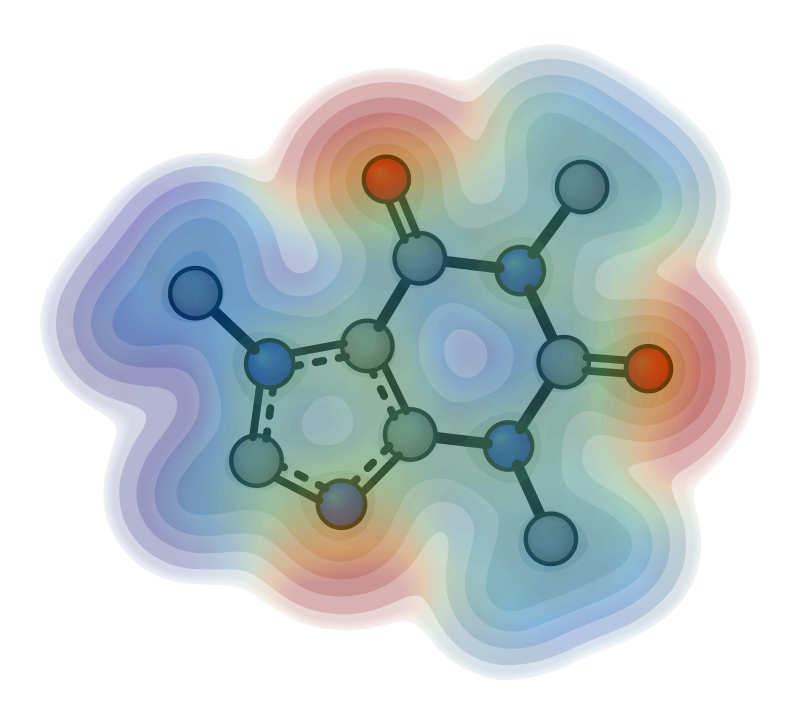

In [43]:
render(mol_dens, esp="structures/caffeine_esp.cube")

## NCI (non-covalent interaction) surface

Pass a density cube (`sign(λ₂)·ρ`) as `molecule` and the reduced density gradient cube as `nci=`.

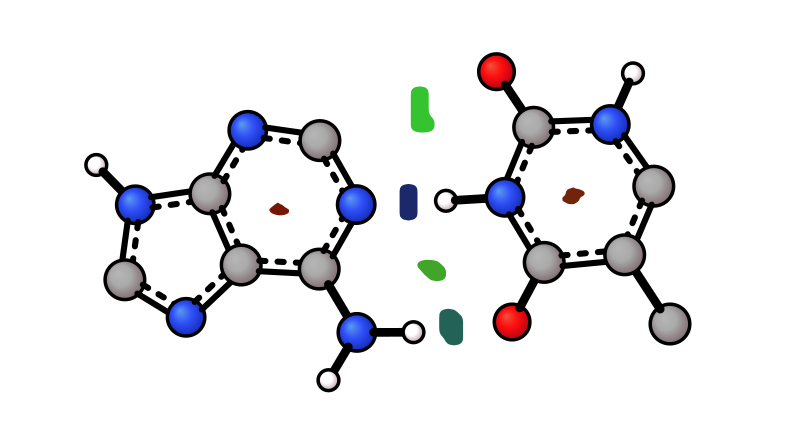

In [44]:
mol_bp = load("structures/base-pair-dens.cube")
render(mol_bp, nci="structures/base-pair-grad.cube")

## Convex hull

Draw convex hull facets over selected atoms (e.g. aromatic ring carbons, coordination spheres). Pass `hull=` to `render()`: `True` for all heavy atoms, `"rings"` to auto-detect aromatic rings (one hull per ring), a flat list of 1-indexed atom indices for one subset, or a list of lists for multiple hulls. By default, multiple hulls get different colours from a cycling palette. Hull edges that do not coincide with bonds are drawn as thin lines; disable with `hull_edge=False`.

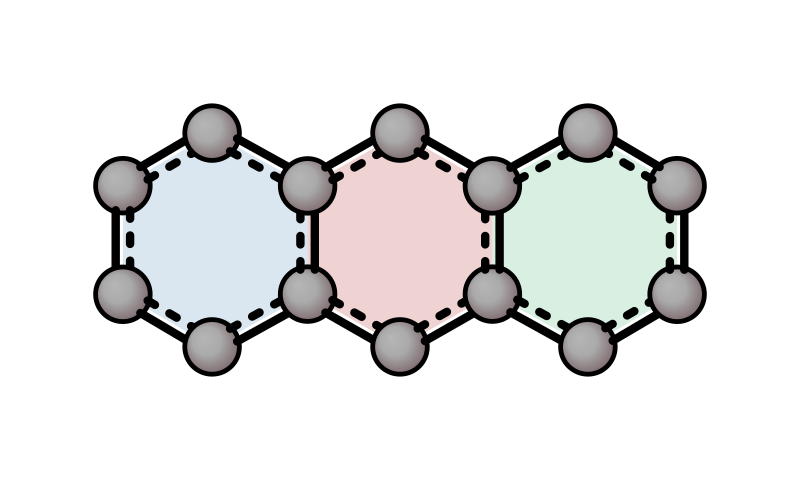

In [45]:
from xyzrender import load, render, render_gif

# Anthracene: 24 atoms - first 14 are C (atoms 1-14). One hull over all ring carbons.
anthracene = load("structures/anthracene.xyz")
rings = [[1, 2, 3, 4, 5, 6], [4, 6, 7, 8, 9, 10], [8, 10, 11, 12, 13, 14]]
render(anthracene, hull=rings)

GIFResult(path=PosixPath('images/anthracene_hull.gif'))
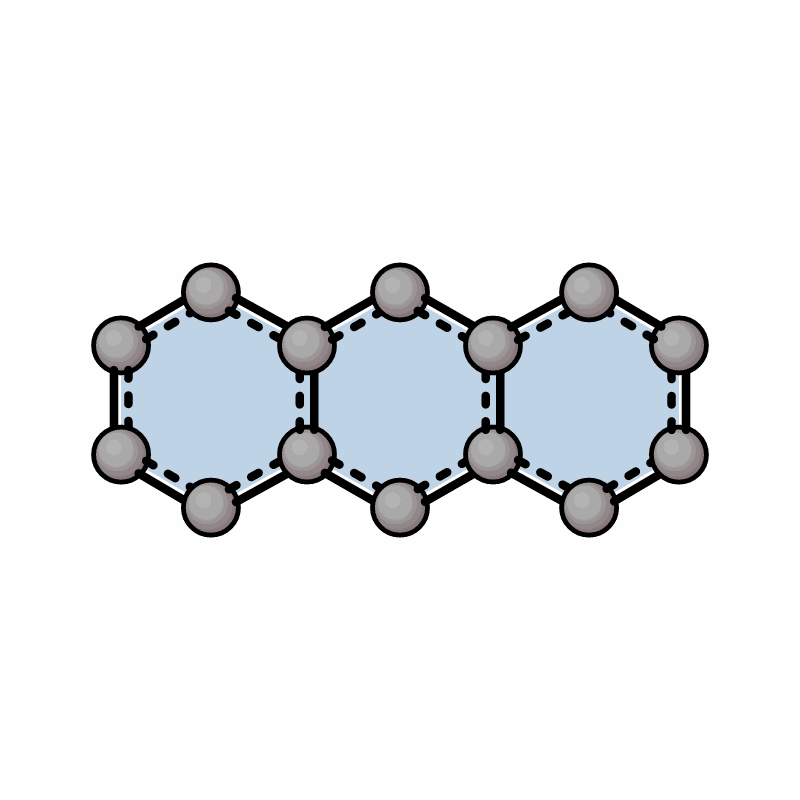

In [46]:
render_gif(
    anthracene,
    gif_rot="y",
    hull="rings",
    hull_color="steelblue",
    hull_opacity=0.35,
    output="images/anthracene_hull.gif",
)

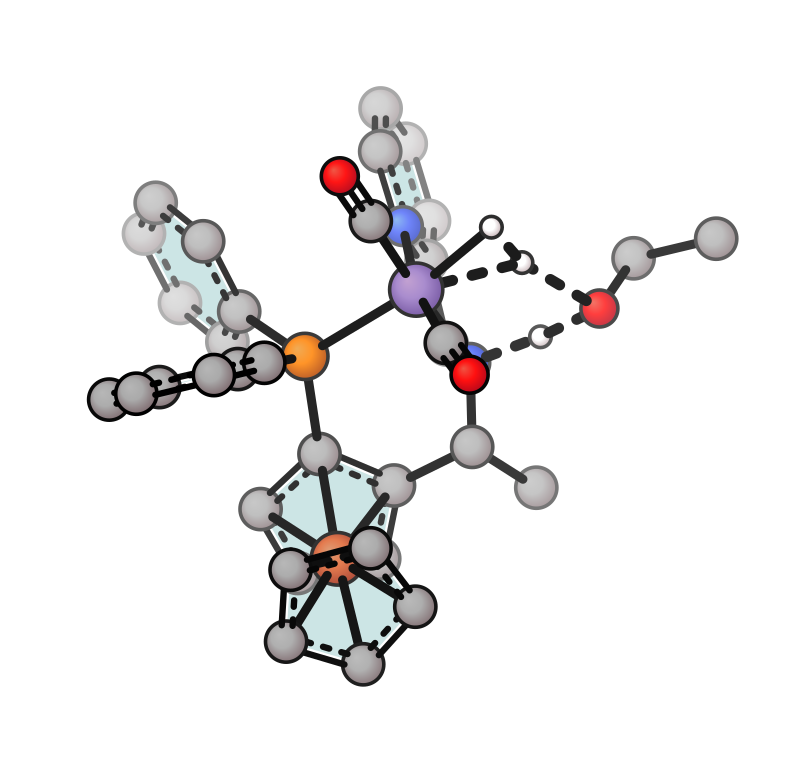

In [47]:
# Auto-detect aromatic rings with hull="rings"
# Each ring gets its own hull; colours cycle automatically (or pass hull_color for a single colour)
mnh = load("structures/mn-h2.log", ts_detect=True)
render(mnh, hull="rings", hull_color="teal")

## GIF animations

GIFResult(path=PosixPath('structures/caffeine.gif'))
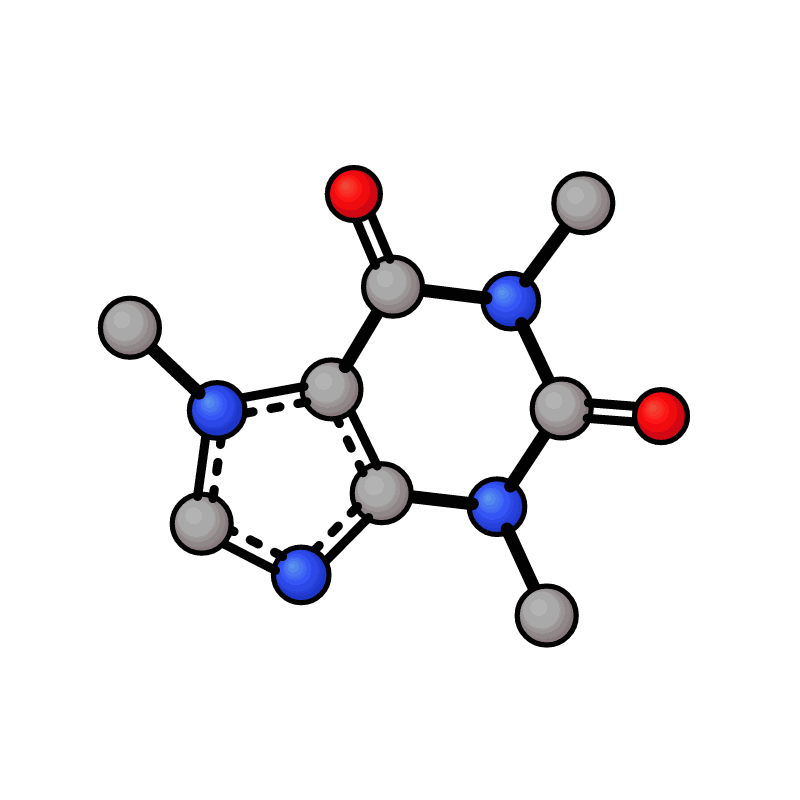

In [48]:
# Rotation GIF
render_gif("structures/caffeine.xyz", gif_rot="y")

GIFResult(path=PosixPath('structures/sn2.gif'))
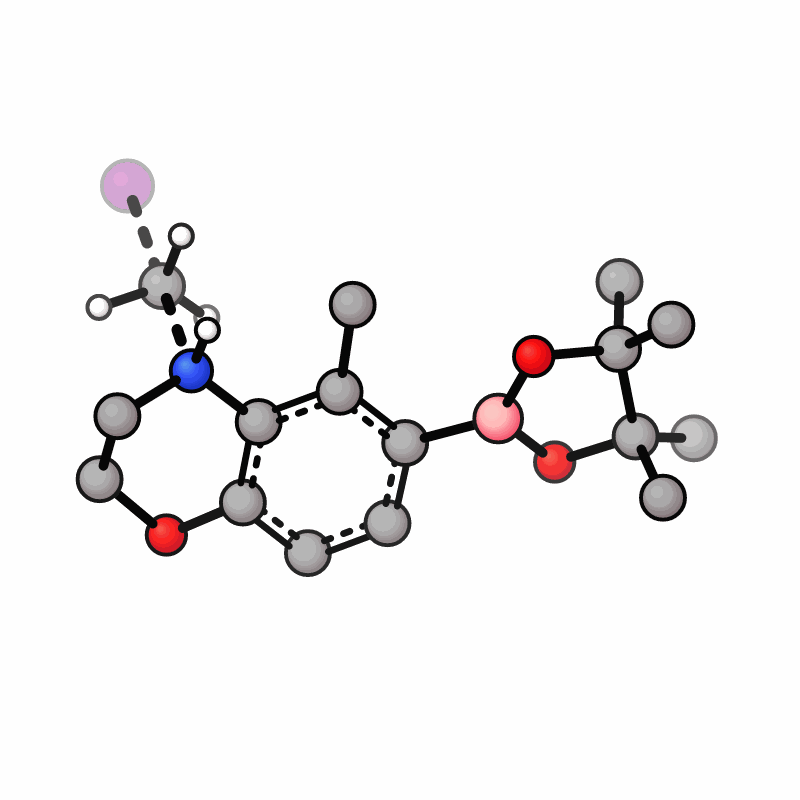

In [49]:
# TS vibration GIF (requires graphRC)
render_gif("structures/sn2.out", gif_ts=True, hy=[3, 4, 5])

## Render results

`render()` returns an `SVGResult` object. In a Jupyter cell it displays inline automatically.
Use `str()` to get the raw SVG text, or `.save()` to write to a file.

In [50]:
result = render(mol)
print(type(result))
print(repr(result))

svg_text = str(result)
print(f"SVG length: {len(svg_text)} characters")

# result.save("caffeine_out.svg")

<class 'xyzrender.types.SVGResult'>
SVG length: 7237 characters


`render_gif()` is similar. `render_gif()` returns a `GIFResult` object. In a Jupyter cell it displays inline automatically.
Use `bytes()` to get the raw GIF bytes, or `.save()` to write to a file.
Pass a `Molecule` object directly — no output path required.


In [51]:
result = render_gif(mol, gif_rot="y")
print(type(result))
print(repr(result))

gif_data = bytes(result)
print(f"GIF length: {len(gif_data)} bytes")

# result.save("caffeine_out.gif")

<class 'xyzrender.types.GIFResult'>
GIFResult(path=PosixPath('/tmp/tmph2d_rshl.gif'))
GIF length: 2266598 bytes
